<a href="https://colab.research.google.com/github/Jayaaa508/Real-time-cctv-violence-detection-/blob/main/Violence_Alert_System.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
pip install telepot

In [ ]:
from keras.models import load_model
from collections import deque
import matplotlib.pyplot as plt
import numpy as np
import argparse
import pickle
import cv2
import telepot
from datetime import datetime
import pytz

In [ ]:
def getTime():
  IST = pytz.timezone('Asia/Kolkata')
  timeNow = datetime.now(IST)
  return timeNow

In [ ]:

import numpy as np
import argparse
import pickle
import cv2
from google.colab.patches import cv2_imshow
import os
import time
from keras.models import load_model
from collections import deque
import telepot

def print_results(video, limit=None):
        trueCount = 0
        imageSaved = 0
        filename = 'savedImage.jpg'
        finalImage = 'finaImage.jpg'
        sendAlert = 0
        location = "Dehradun"
        #fig=plt.figure(figsize=(16, 30))

        print("Loading model ...")
        model = load_model('/content/modelnew.h5')
        Q = deque(maxlen=128)
        vs = cv2.VideoCapture(video)
        writer = None
        (W, H) = (None, None)
        count = 0
        while True:
            # read the next frame from the file
            (grabbed, frame) = vs.read()

            # if the frame was not grabbed, then we have reached the end
            # of the stream
            if not grabbed:
                break

            # if the frame dimensions are empty, grab them
            if W is None or H is None:
                (H, W) = frame.shape[:2]

            # clone the output frame, then convert it from BGR to RGB
            # ordering, resize the frame to a fixed 128x128, and then
            # perform mean subtraction


            output = frame.copy()

            frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
            frame = cv2.resize(frame, (128, 128)).astype("float32")
            frame = frame.reshape(128, 128, 3) / 255

            # make predictions on the frame and then update the predictions
            # queue
            preds = model.predict(np.expand_dims(frame, axis=0))[0]
#             print("preds",preds)
            Q.append(preds)

            # perform prediction averaging over the current history of
            # previous predictions
            results = np.array(Q).mean(axis=0)
            i = (preds > 0.50)[0]
            label = i

            text_color = (0, 255, 0) # default : green

            if label: # Violence prob
                text_color = (0, 0, 255) # red
                trueCount = trueCount + 1

            else:
                text_color = (0, 255, 0)

            text = "Violence: {}".format(label)
            FONT = cv2.FONT_HERSHEY_SIMPLEX

            cv2.putText(output, text, (35, 50), FONT,1.25, text_color, 3)

            # check if the video writer is None
            if writer is None:
                # initialize our video writer
                fourcc = cv2.VideoWriter_fourcc(*"MJPG")
                writer = cv2.VideoWriter("recordedVideo.avi", fourcc, 30,(W, H), True)

            # write the output frame to disk
            writer.write(output)

            # show the output image
            cv2_imshow(output)

            if(trueCount == 50):
              if(imageSaved == 0):
                if(label):
                  cv2.imwrite(filename, output)
                  imageSaved = 1

              if(sendAlert == 0):
                timeMoment = getTime()
                bot = telepot.Bot('6897660022:AAFHYj1T4IugeCmsFB2dVJg_6gjToLwDfs4')
                bot.sendMessage(-1002145712009, f"VIOLENCE ALERT!! \nLOCATION: {location} \nTIME: {timeMoment}")
                bot.sendPhoto(-1002145712009, photo=open(filename, 'rb'))
                sendAlert = 1

            key = cv2.waitKey(1) & 0xFF

            # if the `q` key was pressed, break from the loop
            if key == ord("q"):
                break
        # release the file pointersq
        print("[INFO] cleaning up...")
        writer.release()
        vs.release()

In [ ]:
V_path = '/content/WhatsApp Video 2024-04-26 at 12.13.14_db4f62c7.mp4'
NV_path ='/content/nonv.mp4'

Loading model ...
1/1 [==============================] - 1s 1s/step


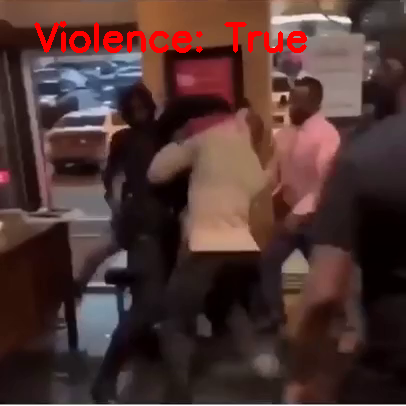

1/1 [==============================] - 0s 40ms/step


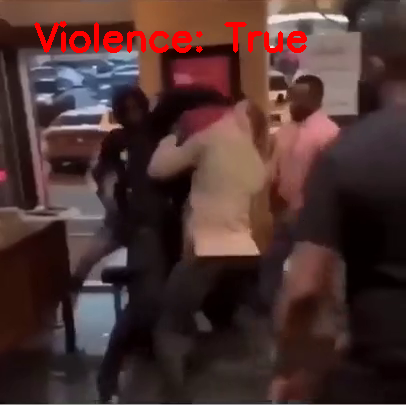

1/1 [==============================] - 0s 37ms/step


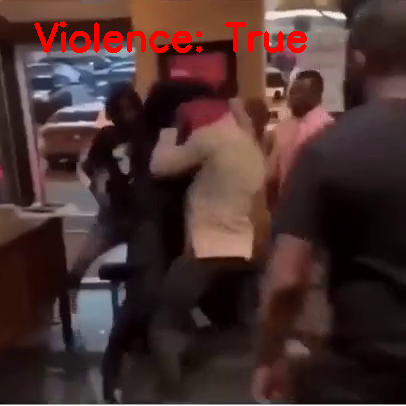

1/1 [==============================] - 0s 40ms/step


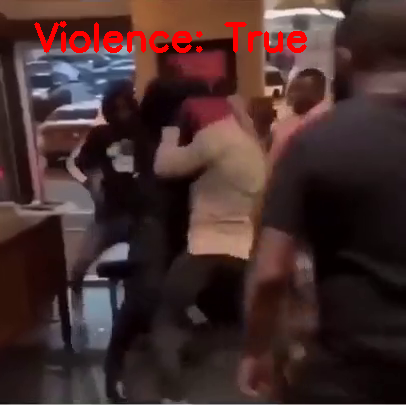

1/1 [==============================] - 0s 50ms/step


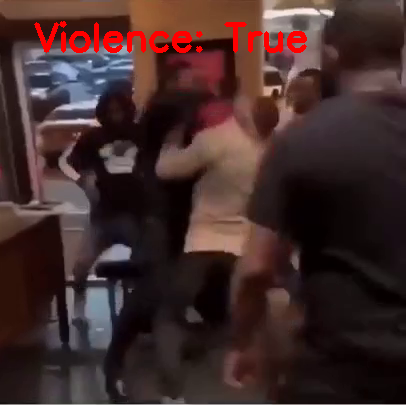

1/1 [==============================] - 0s 40ms/step


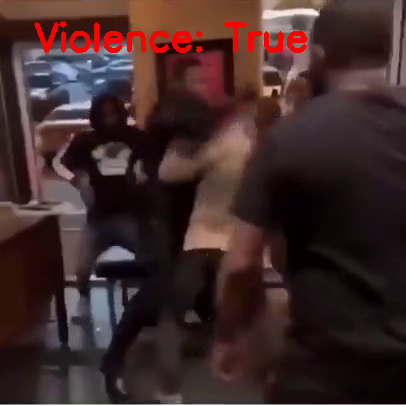

1/1 [==============================] - 0s 41ms/step


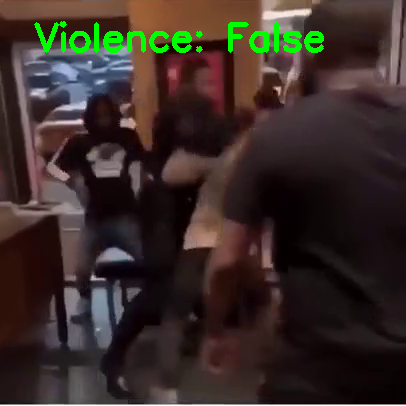

1/1 [==============================] - 0s 39ms/step


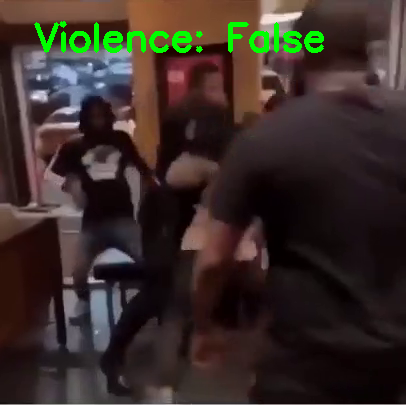

1/1 [==============================] - 0s 42ms/step


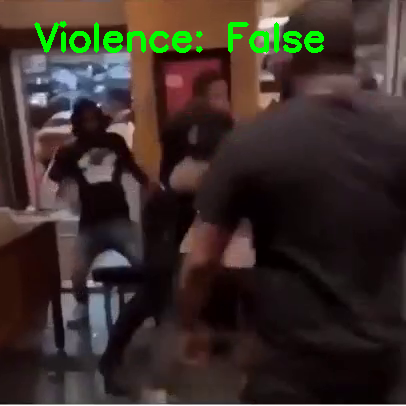

1/1 [==============================] - 0s 36ms/step


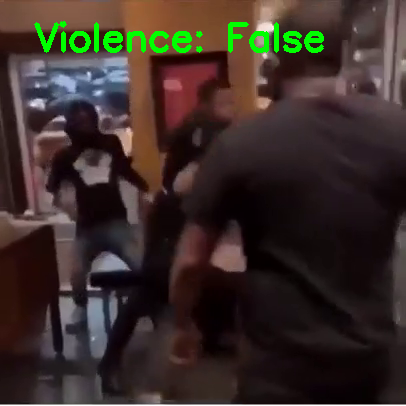

1/1 [==============================] - 0s 35ms/step


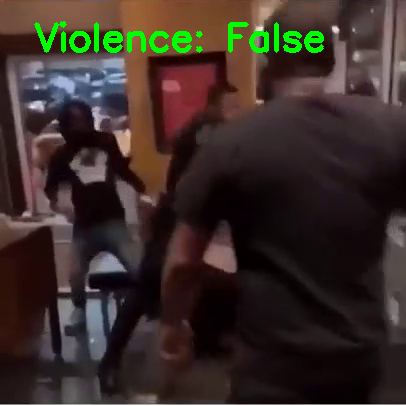

1/1 [==============================] - 0s 34ms/step


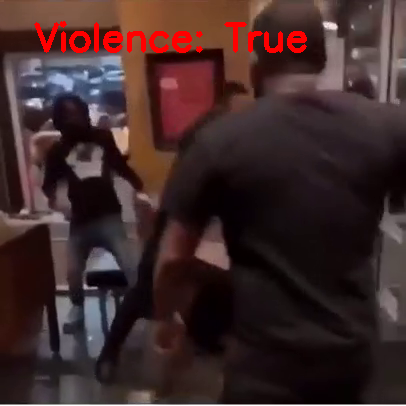

1/1 [==============================] - 0s 62ms/step


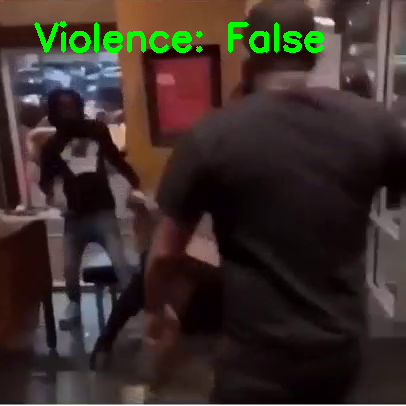

1/1 [==============================] - 0s 43ms/step


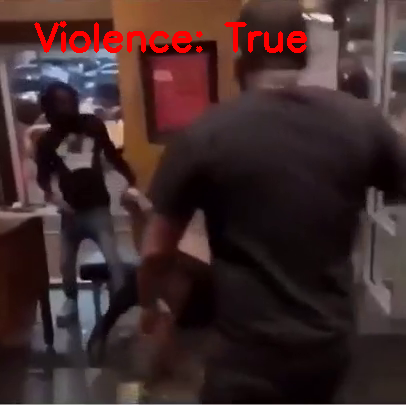

1/1 [==============================] - 0s 44ms/step


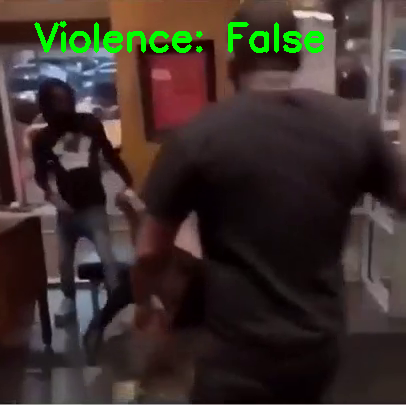

1/1 [==============================] - 0s 75ms/step


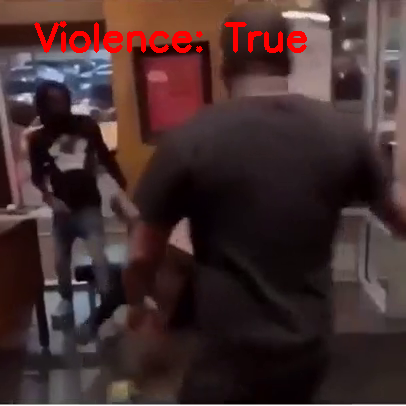

1/1 [==============================] - 0s 98ms/step


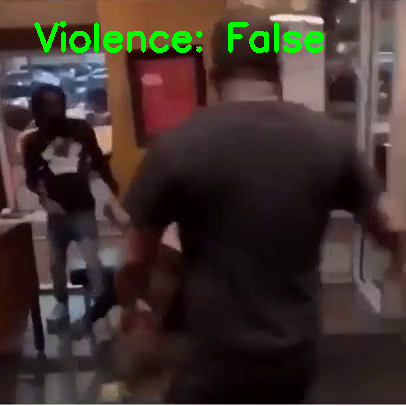

1/1 [==============================] - 0s 93ms/step


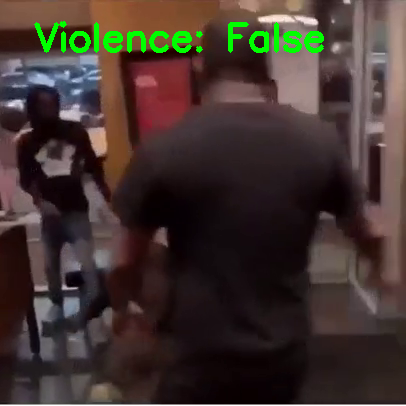

1/1 [==============================] - 0s 91ms/step


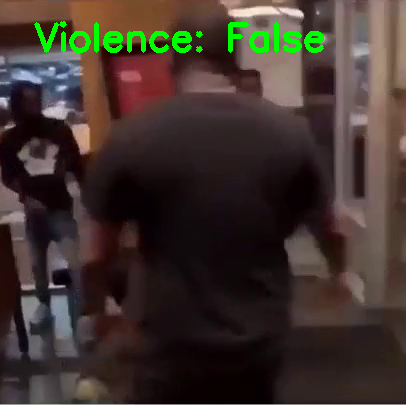

1/1 [==============================] - 0s 124ms/step


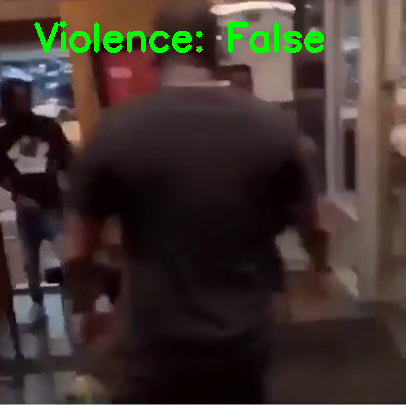

1/1 [==============================] - 0s 85ms/step


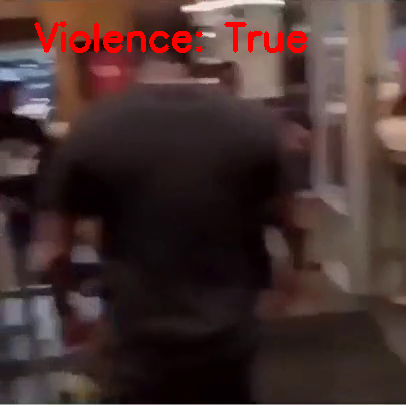

1/1 [==============================] - 0s 73ms/step


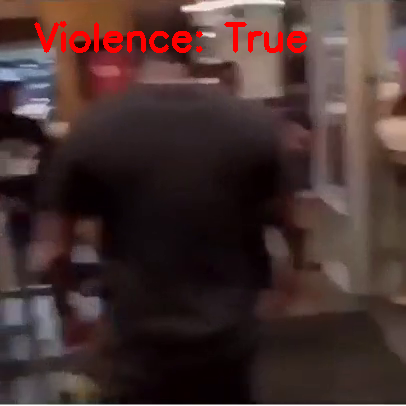

1/1 [==============================] - 0s 76ms/step


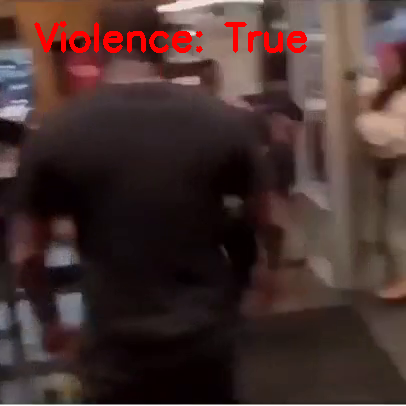

1/1 [==============================] - 0s 86ms/step


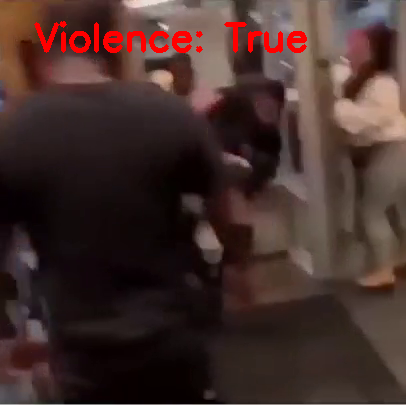

1/1 [==============================] - 0s 62ms/step


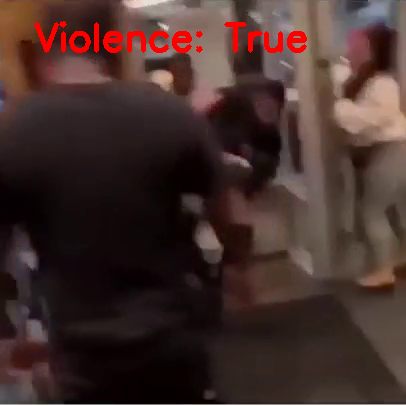

1/1 [==============================] - 0s 73ms/step


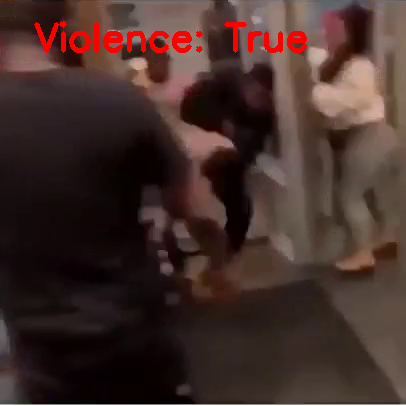

1/1 [==============================] - 0s 88ms/step


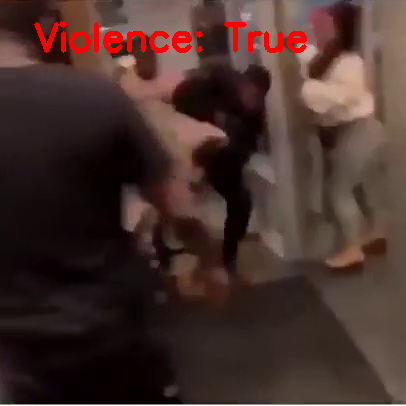

1/1 [==============================] - 0s 87ms/step


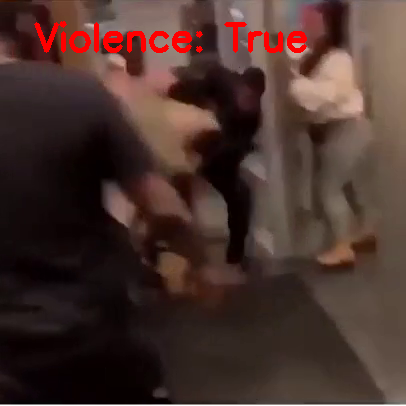

1/1 [==============================] - 0s 56ms/step


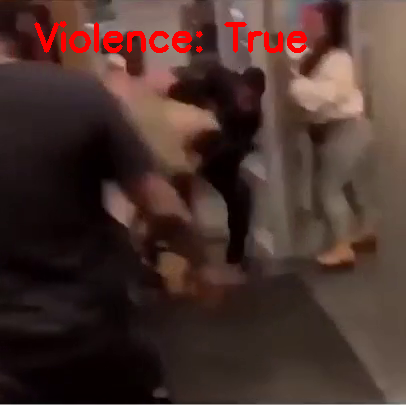

1/1 [==============================] - 0s 55ms/step


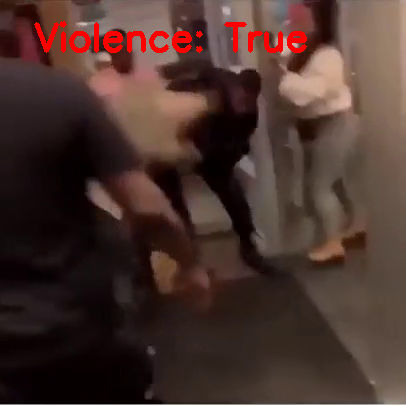

1/1 [==============================] - 0s 73ms/step


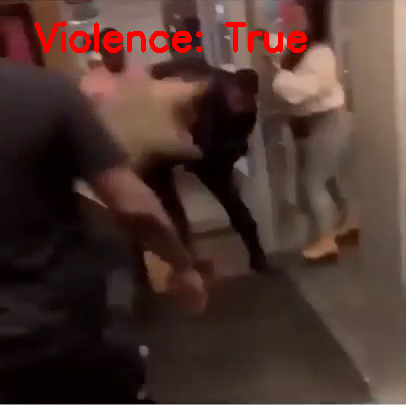

1/1 [==============================] - 0s 63ms/step


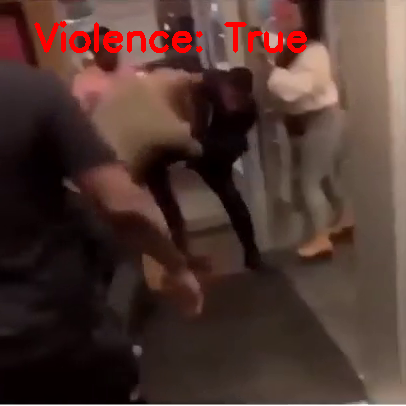

1/1 [==============================] - 0s 106ms/step


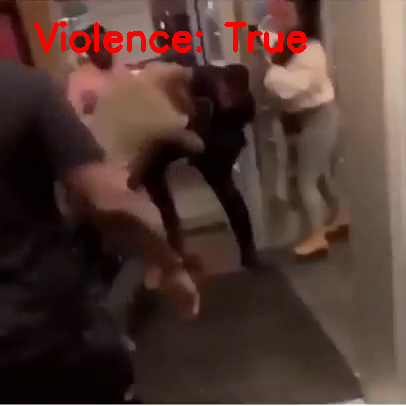

1/1 [==============================] - 0s 52ms/step


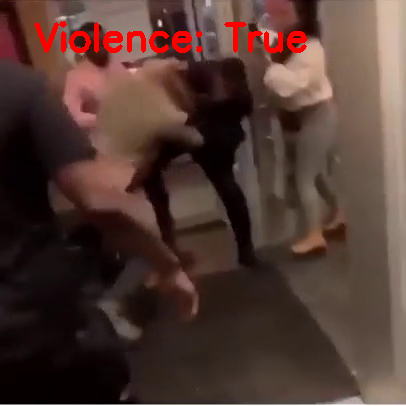

1/1 [==============================] - 0s 54ms/step


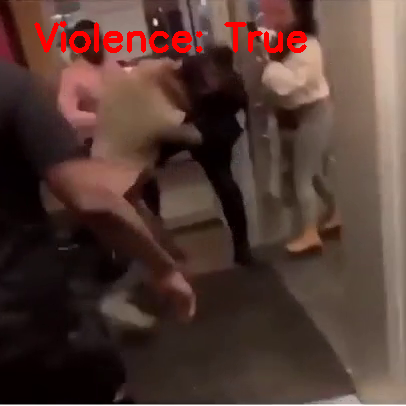

1/1 [==============================] - 0s 59ms/step


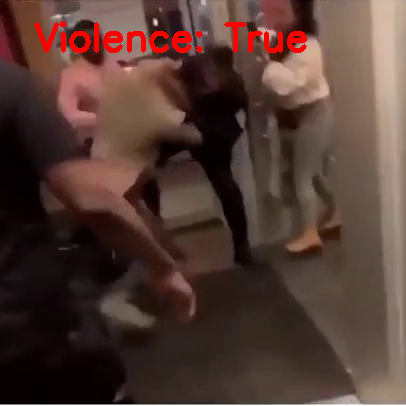

1/1 [==============================] - 0s 68ms/step


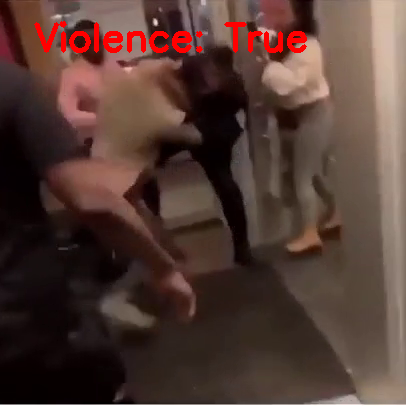

1/1 [==============================] - 0s 51ms/step


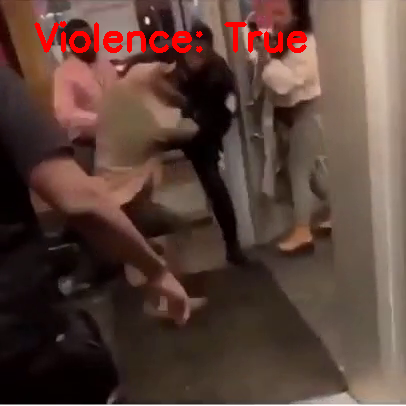

1/1 [==============================] - 0s 50ms/step


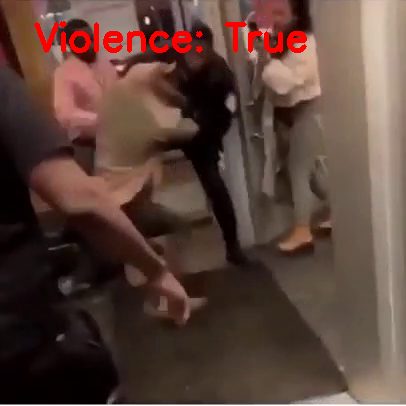

1/1 [==============================] - 0s 57ms/step


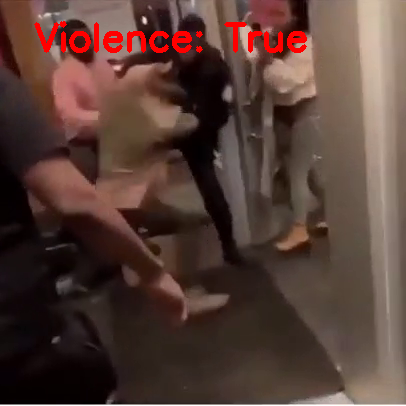

1/1 [==============================] - 0s 54ms/step


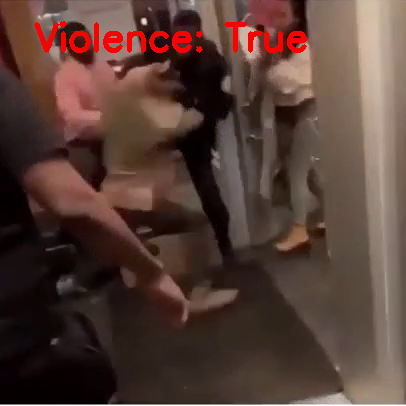

1/1 [==============================] - 0s 50ms/step


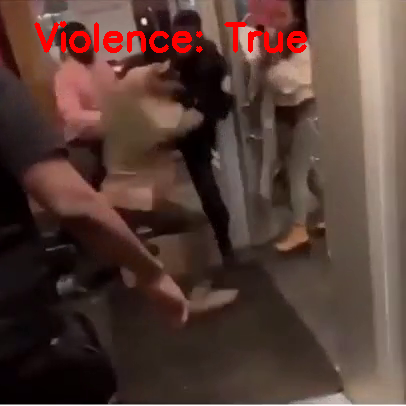

1/1 [==============================] - 0s 62ms/step


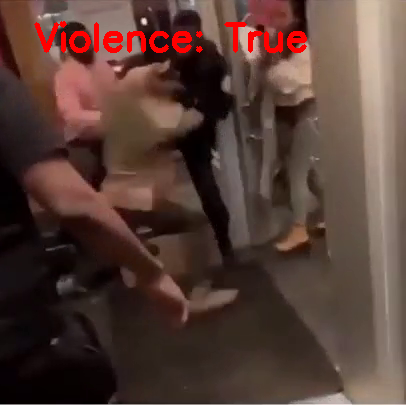

1/1 [==============================] - 0s 64ms/step


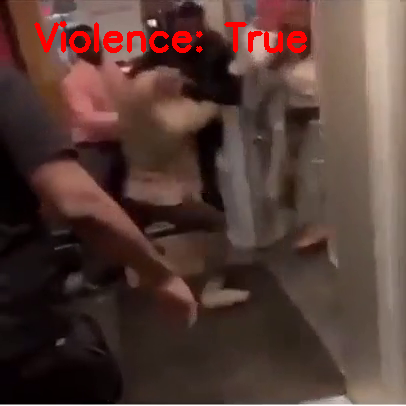

1/1 [==============================] - 0s 64ms/step


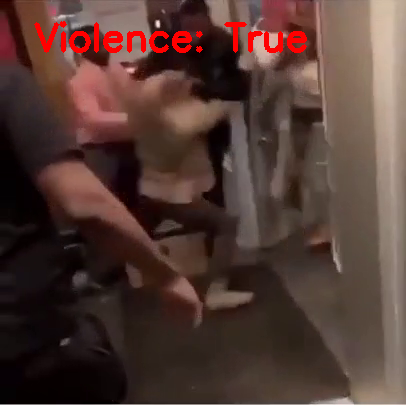

1/1 [==============================] - 0s 61ms/step


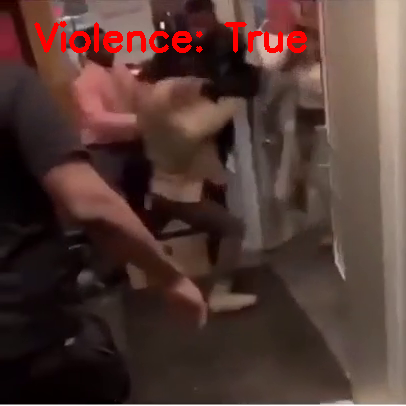

1/1 [==============================] - 0s 65ms/step


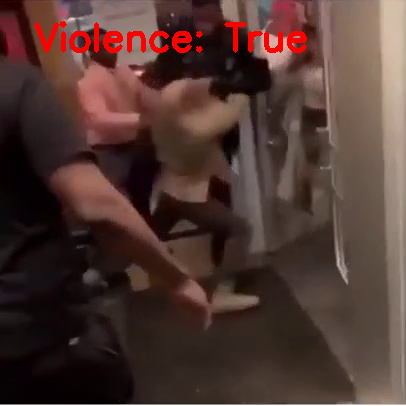

1/1 [==============================] - 0s 60ms/step


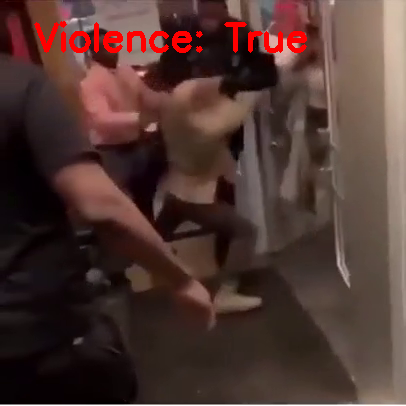

1/1 [==============================] - 0s 75ms/step


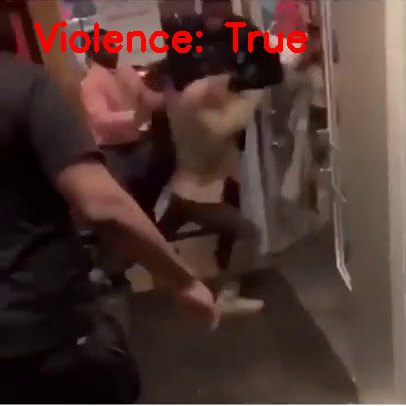

1/1 [==============================] - 0s 96ms/step


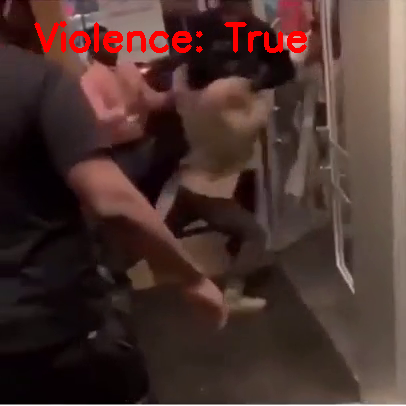

1/1 [==============================] - 0s 54ms/step


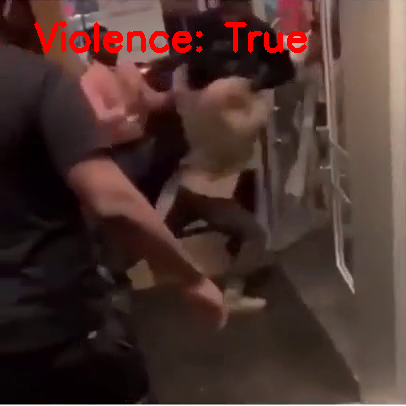

1/1 [==============================] - 0s 54ms/step


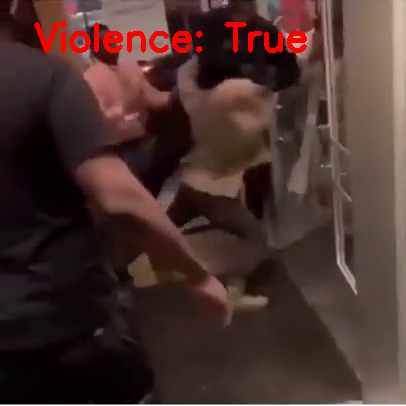

1/1 [==============================] - 0s 60ms/step


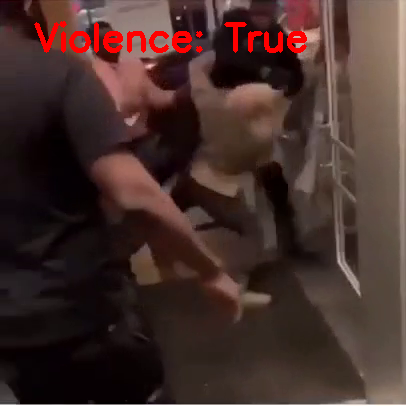

1/1 [==============================] - 0s 61ms/step


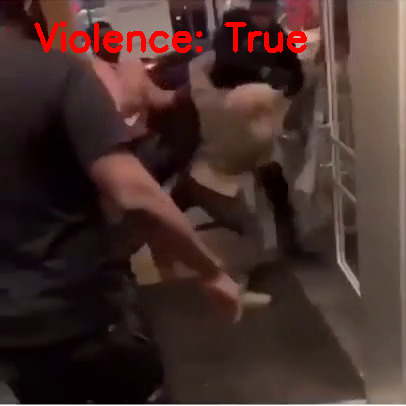

1/1 [==============================] - 0s 54ms/step


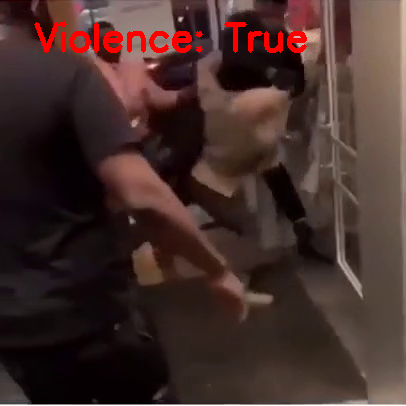

1/1 [==============================] - 0s 57ms/step


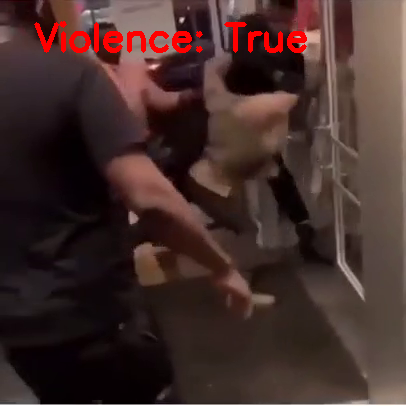

1/1 [==============================] - 0s 52ms/step


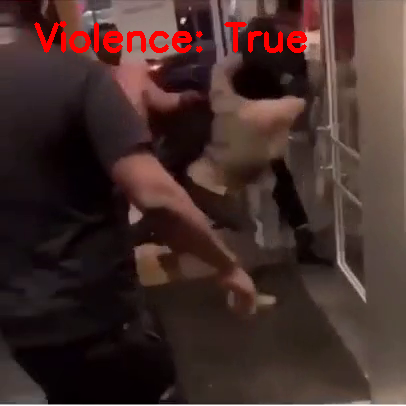

1/1 [==============================] - 0s 67ms/step


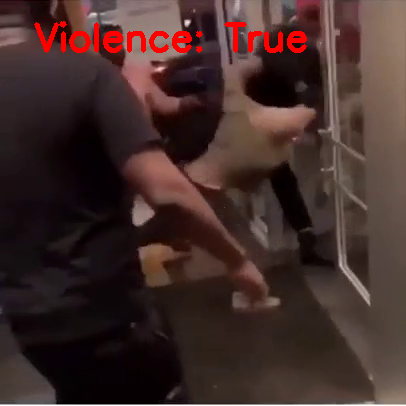

1/1 [==============================] - 0s 83ms/step


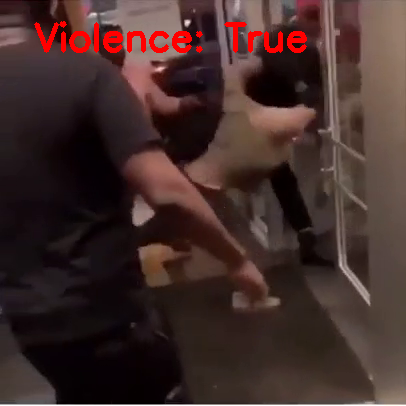

1/1 [==============================] - 0s 57ms/step


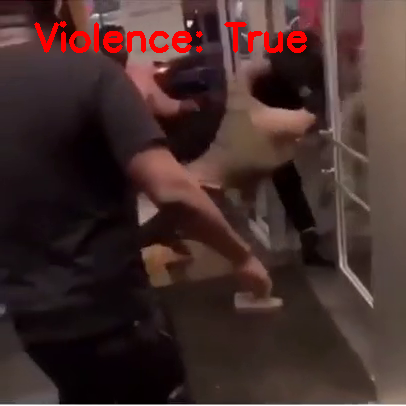

1/1 [==============================] - 0s 55ms/step


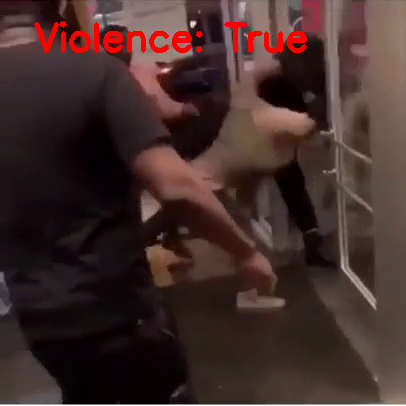

1/1 [==============================] - 0s 50ms/step


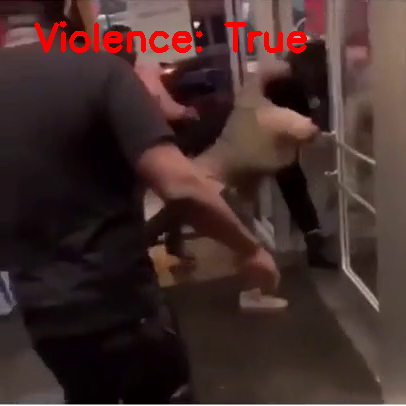

1/1 [==============================] - 0s 71ms/step


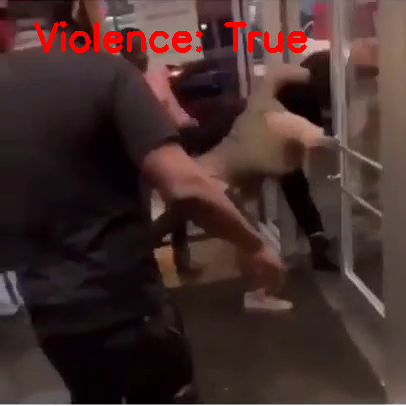

1/1 [==============================] - 0s 77ms/step


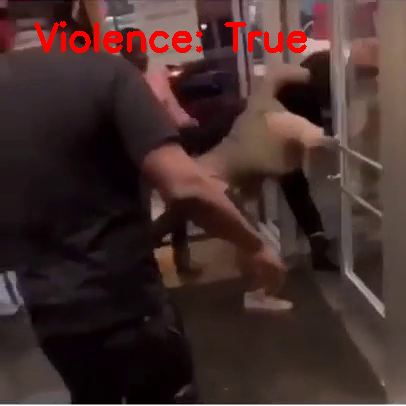

1/1 [==============================] - 0s 83ms/step


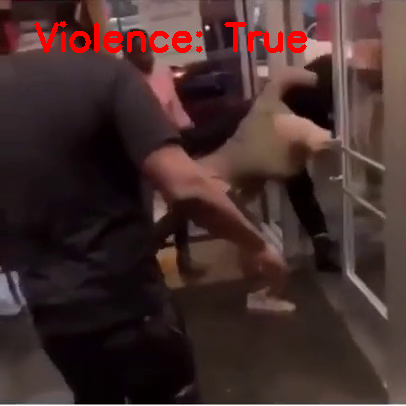

1/1 [==============================] - 0s 82ms/step


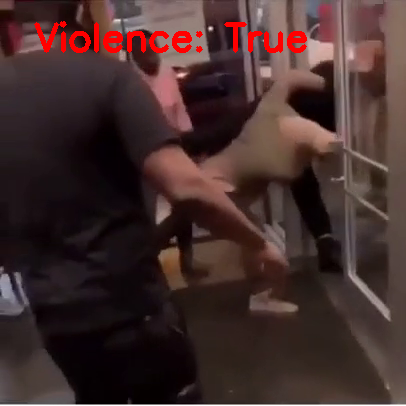

1/1 [==============================] - 0s 77ms/step


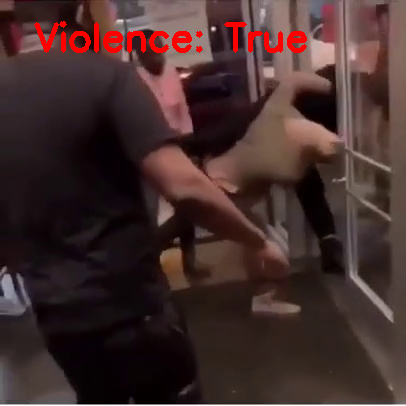

1/1 [==============================] - 0s 87ms/step


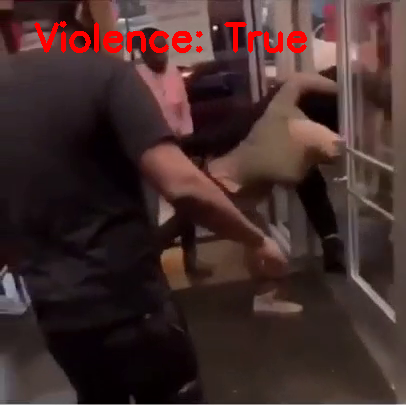

1/1 [==============================] - 0s 53ms/step


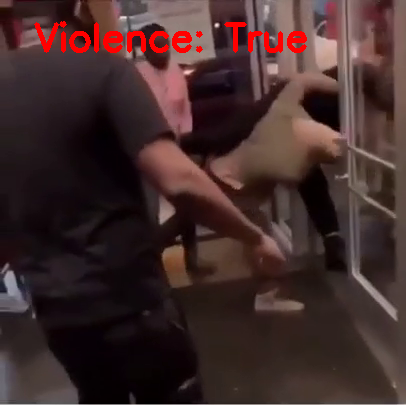

1/1 [==============================] - 0s 55ms/step


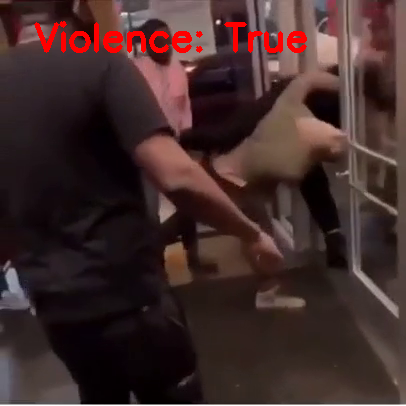

1/1 [==============================] - 0s 67ms/step


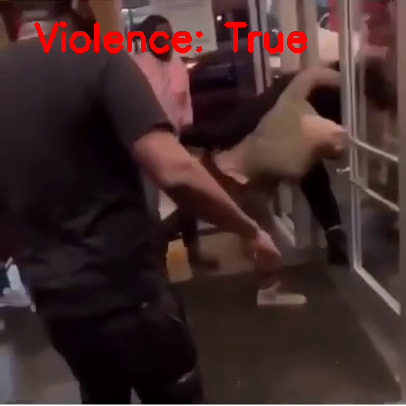

1/1 [==============================] - 0s 78ms/step


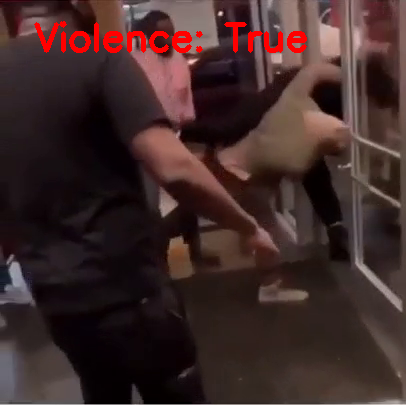

1/1 [==============================] - 0s 54ms/step


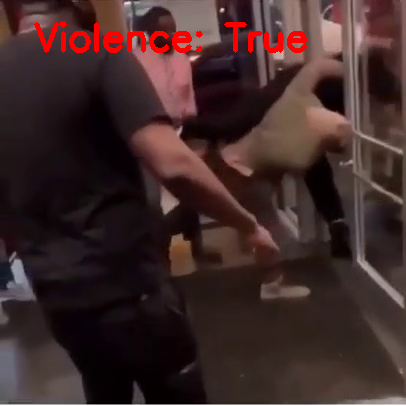

1/1 [==============================] - 0s 54ms/step


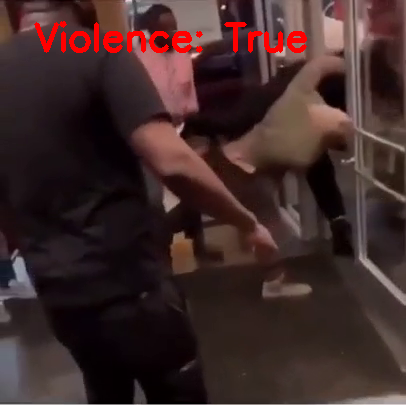

1/1 [==============================] - 0s 77ms/step


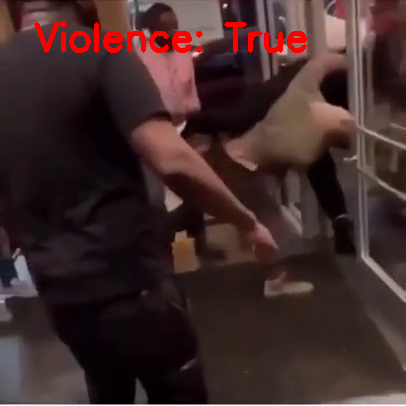

1/1 [==============================] - 0s 60ms/step


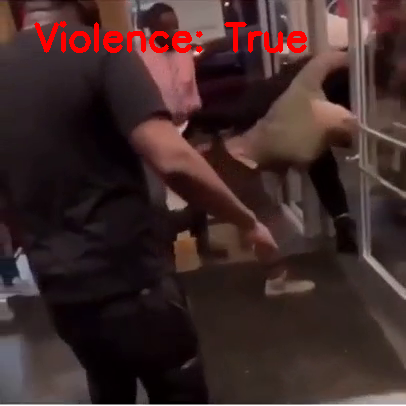

1/1 [==============================] - 0s 53ms/step


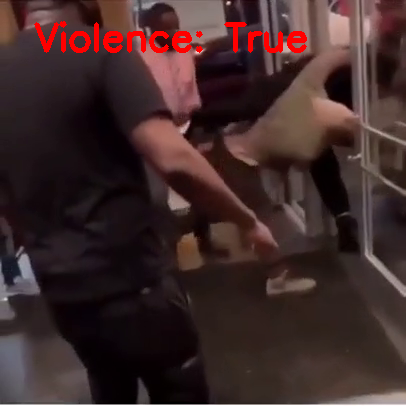

1/1 [==============================] - 0s 56ms/step


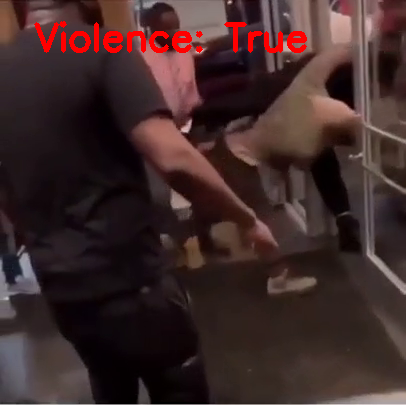

1/1 [==============================] - 0s 54ms/step


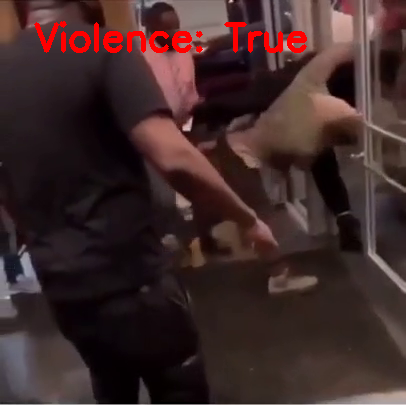

1/1 [==============================] - 0s 65ms/step


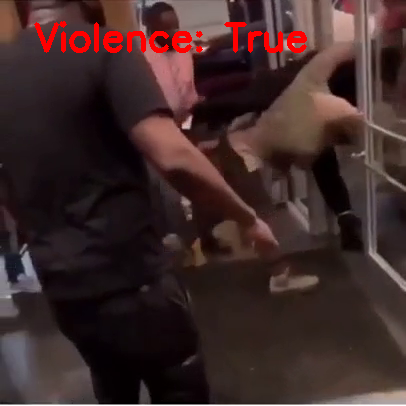

1/1 [==============================] - 0s 53ms/step


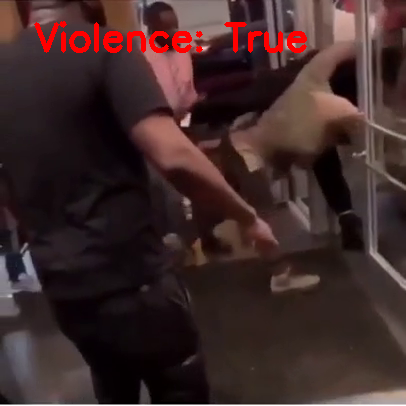

1/1 [==============================] - 0s 53ms/step


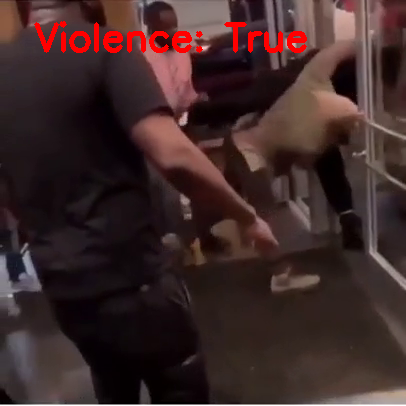

1/1 [==============================] - 0s 53ms/step


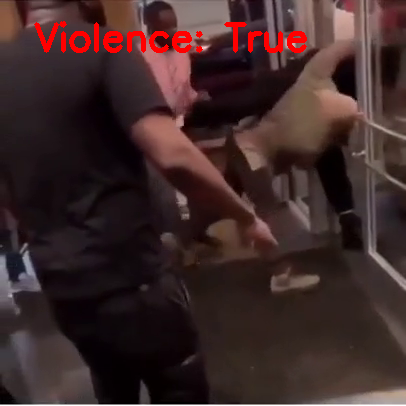

1/1 [==============================] - 0s 54ms/step


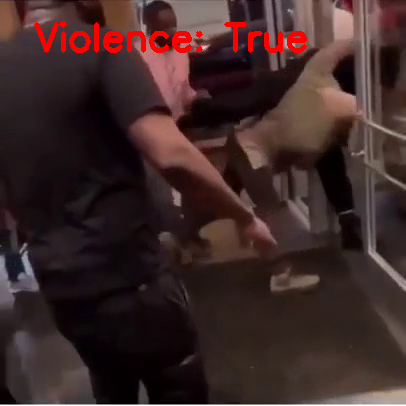

1/1 [==============================] - 0s 52ms/step


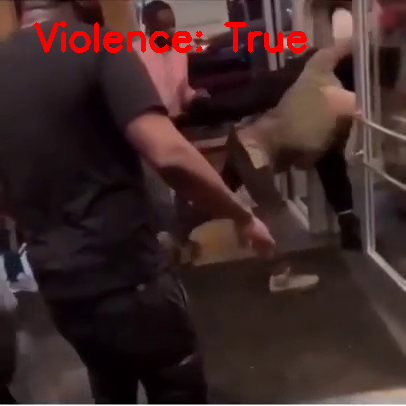

1/1 [==============================] - 0s 53ms/step


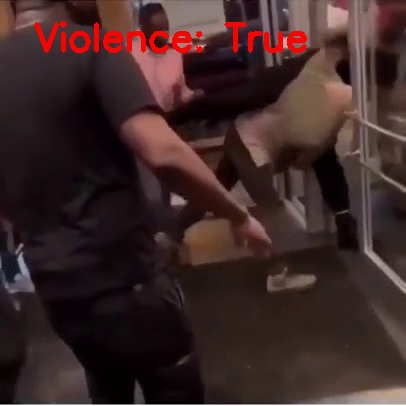

1/1 [==============================] - 0s 51ms/step


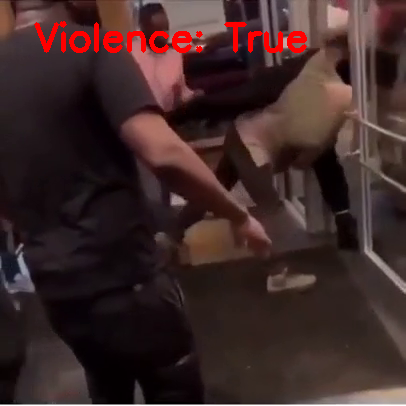

1/1 [==============================] - 0s 62ms/step


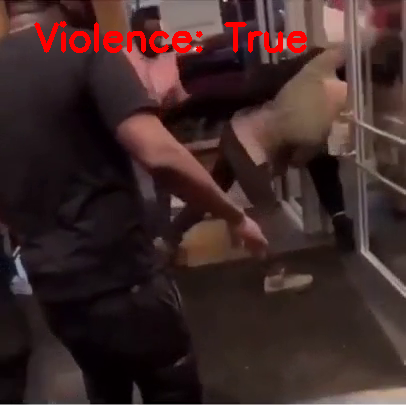

1/1 [==============================] - 0s 63ms/step


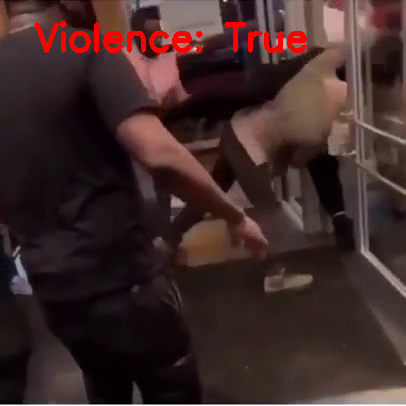

1/1 [==============================] - 0s 63ms/step


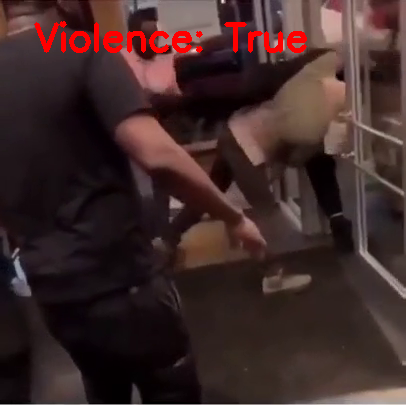

1/1 [==============================] - 0s 69ms/step


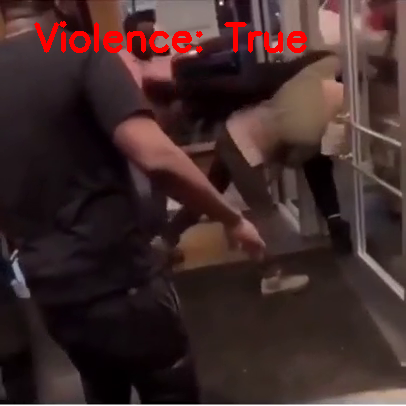

1/1 [==============================] - 0s 55ms/step


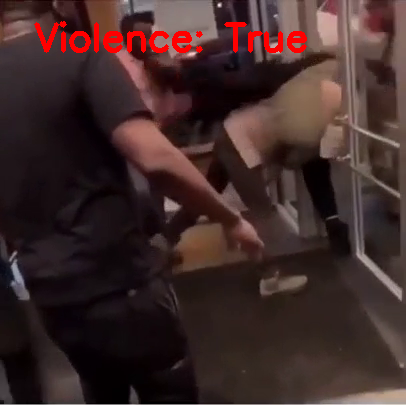

1/1 [==============================] - 0s 54ms/step


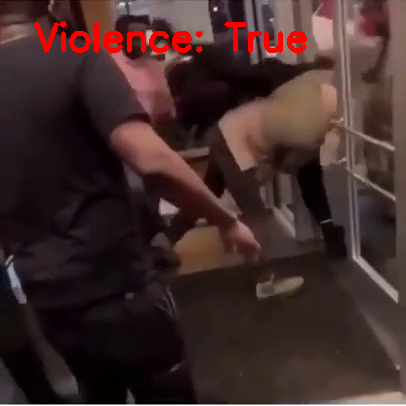

1/1 [==============================] - 0s 60ms/step


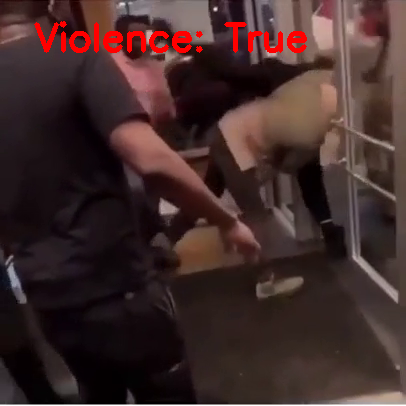

1/1 [==============================] - 0s 71ms/step


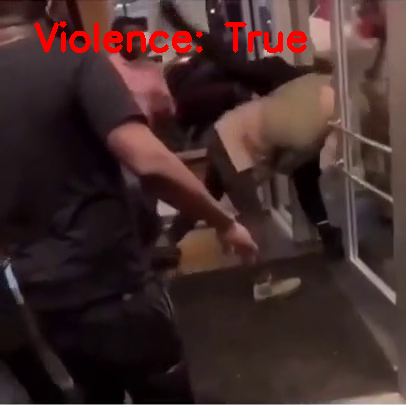

1/1 [==============================] - 0s 54ms/step


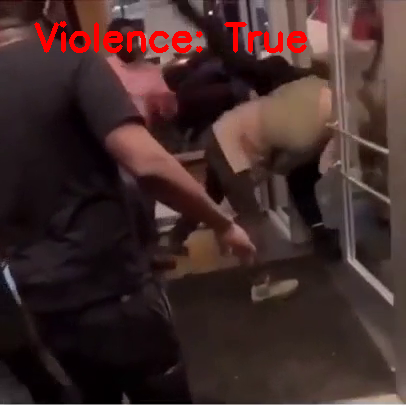

1/1 [==============================] - 0s 55ms/step


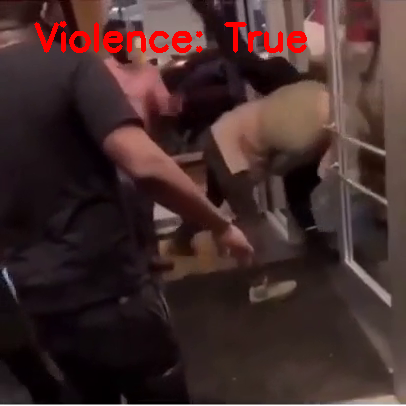

1/1 [==============================] - 0s 53ms/step


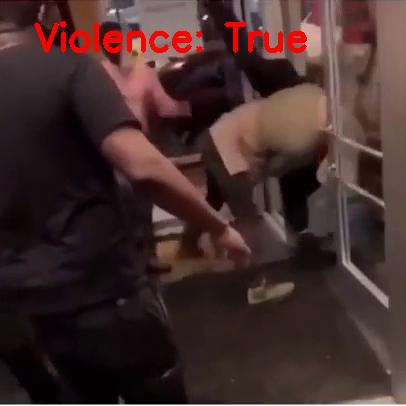

1/1 [==============================] - 0s 54ms/step


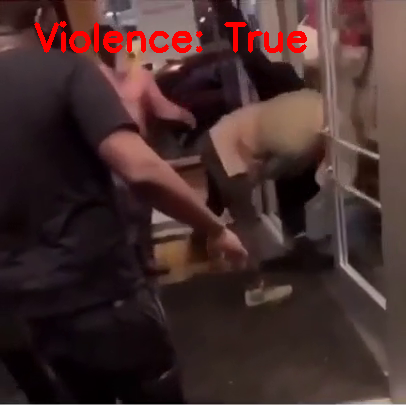

1/1 [==============================] - 0s 58ms/step


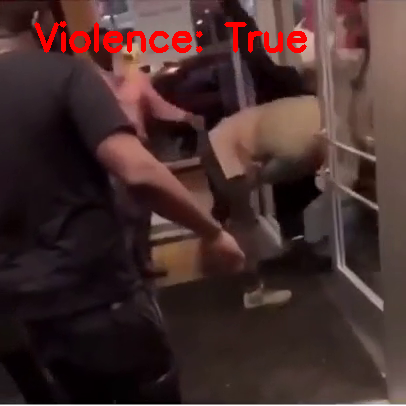

1/1 [==============================] - 0s 53ms/step


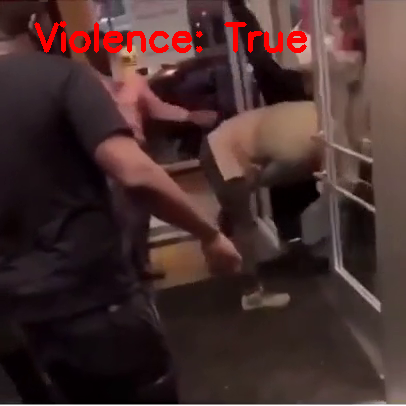

1/1 [==============================] - 0s 56ms/step


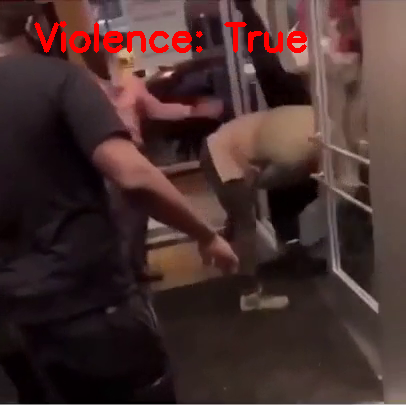

[INFO] cleaning up...


In [ ]:
print_results(V_path)